In [1]:
#importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
color_pal = sns.color_palette()
plt.style.use('fivethirtyeight')
from pandas.api.types import CategoricalDtype
import plotly.express as px
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import accuracy_score

In [2]:
# reading in data
file_path = r'C:\Users\user\Desktop\PJME_hourly.csv'
data = pd.read_csv(file_path, encoding='latin1')
data = data.set_index('Datetime')
data.index = pd.to_datetime(data.index)

In [3]:
data.head()

,PJME_MW
Datetime,
2002-12-31 01:00:00,26498.0
2002-12-31 02:00:00,25147.0
2002-12-31 03:00:00,24574.0
2002-12-31 04:00:00,24393.0
2002-12-31 05:00:00,24860.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 145366 entries, 2002-12-31 01:00:00 to 2018-01-02 00:00:00
Data columns (total 1 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   PJME_MW  145366 non-null  float64
dtypes: float64(1)
memory usage: 2.2 MB


In [5]:
data.isnull().sum()

PJME_MW    0
dtype: int64

In [6]:
print(f"MAX date is {data.index.max()}")
print(f"MIN date is {data.index.min()}")

MAX date is 2018-08-03 00:00:00
MIN date is 2002-01-01 01:00:00


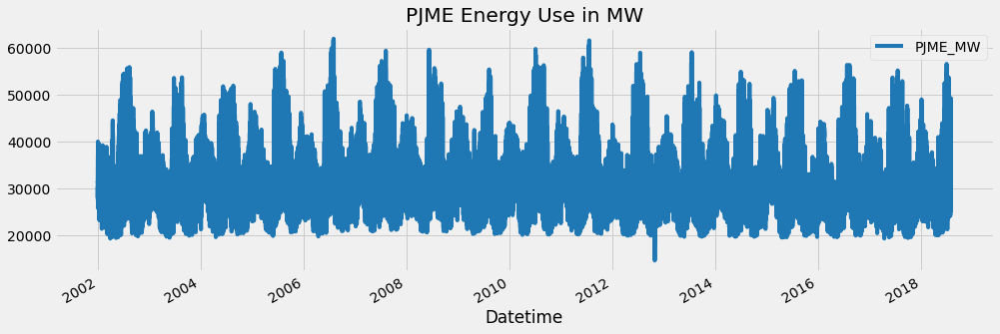

In [7]:
#plotting data
data.plot(figsize=(15, 5),
        color=color_pal[0],
        title='PJME Energy Use in MW')
plt.show()


In [8]:
data.describe()

,PJME_MW
count,145366.000000
mean,32080.222831
std,6464.012166
min,14544.000000
25%,27573.000000
50%,31421.000000
75%,35650.000000
max,62009.000000


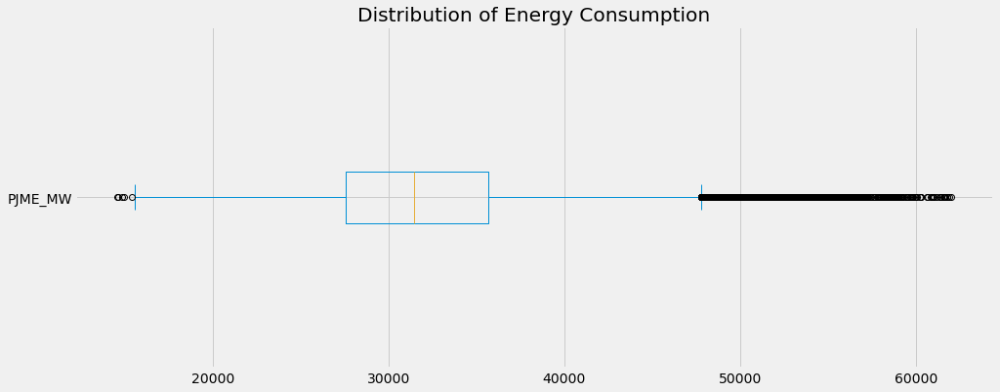

In [9]:
#checking for outliers
fig, ax = plt.subplots(figsize=(15, 6))
data['PJME_MW'].plot(kind='box', vert=False, title='Distribution of Energy Consumption', ax=ax)
plt.show()

In [10]:
# dealing with outliers
data = data[(data['PJME_MW'] > 20000) & (data['PJME_MW'] <= 46500)]

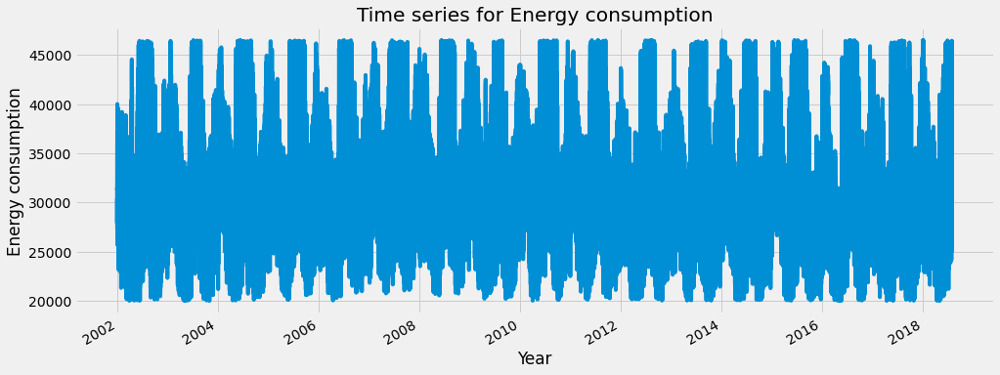

In [11]:
fig, ax = plt.subplots(figsize=(15, 6))
data['PJME_MW'].plot(xlabel='Year', ylabel='Energy consumption', title='Time series for Energy consumption', ax=ax);

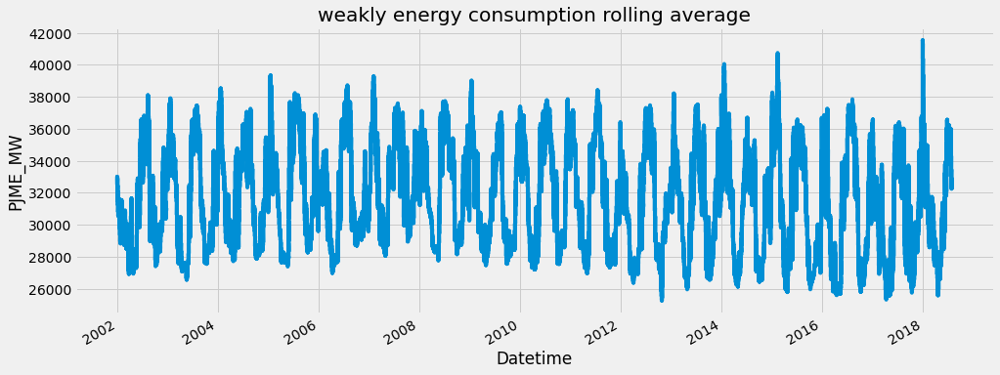

In [12]:
#plotting a 168 hours rolling average
fig, ax = plt.subplots(figsize=(15, 6))
data['PJME_MW'].rolling(168).mean().plot(ax=ax, ylabel='PJME_MW', title='weakly energy consumption rolling average')
plt.show()

In [13]:
#creating a hour lag
data['PJME_MW.L1'] = data['PJME_MW'].shift(1)
data.dropna(inplace=True)

In [14]:
#Feature engineering
cat_type = CategoricalDtype(categories=['Monday','Tuesday',
                                        'Wednesday',
                                        'Thursday','Friday',
                                        'Saturday','Sunday'],
                            ordered=True)

def create_features(df, label=None):
    """
    Creates time series features from datetime index.
    """
    df = df.copy()
    df['date'] = df.index
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['weekday'] = df['date'].dt.day_name()
    df['weekday'] = df['weekday'].astype(cat_type)
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    df['date_offset'] = (df.date.dt.month*100 + df.date.dt.day - 320)%1300

    df['season'] = pd.cut(df['date_offset'], [0, 300, 602, 900, 1300], 
                          labels=['Spring', 'Summer', 'Fall', 'Winter']
                   )
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear','weekday',
           'season']]
    if label:
        y = df[label]
        return X, y
    return X

X, y = create_features(data, label='PJME_MW')
features_and_target = pd.concat([X, y], axis=1)

C:\Users\user\AppData\Local\Temp\ipykernel_8516\1962338582.py:22: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated. Please use Series.dt.isocalendar().week instead.
  df['weekofyear'] = df['date'].dt.weekofyear


In [15]:
features_and_target

,hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,weekday,season,PJME_MW
Datetime,,,,,,,,,,,
2002-12-31 02:00:00,2,1,4,12,2002,365,31,1,Tuesday,Winter,25147.0
2002-12-31 03:00:00,3,1,4,12,2002,365,31,1,Tuesday,Winter,24574.0
2002-12-31 04:00:00,4,1,4,12,2002,365,31,1,Tuesday,Winter,24393.0
2002-12-31 05:00:00,5,1,4,12,2002,365,31,1,Tuesday,Winter,24860.0
2002-12-31 06:00:00,6,1,4,12,2002,365,31,1,Tuesday,Winter,26222.0
...,...,...,...,...,...,...,...,...,...,...,...
2018-01-01 20:00:00,20,0,1,1,2018,1,1,1,Monday,Winter,44284.0
2018-01-01 21:00:00,21,0,1,1,2018,1,1,1,Monday,Winter,43751.0
2018-01-01 22:00:00,22,0,1,1,2018,1,1,1,Monday,Winter,42402.0


In [16]:
features_and_target['PJME_MW.L1'] = features_and_target['PJME_MW'].shift(1)
features_and_target.dropna(inplace=True)

In [17]:
features_and_target.corr()

,hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,PJME_MW,PJME_MW.L1
hour,1.000000,0.010944,-0.006820,-0.005101,0.001963,-0.004954,0.000594,-0.005120,0.493577,0.490944
dayofweek,0.010944,1.000000,0.003532,0.002522,-0.002482,0.002401,-0.000634,0.002603,-0.172655,-0.170444
quarter,-0.006820,0.003532,1.000000,0.972037,-0.042195,0.968972,0.016119,0.947180,-0.084982,-0.084887
month,-0.005101,0.002522,0.972037,1.000000,-0.043164,0.996570,0.014415,0.970737,-0.075535,-0.075474
year,0.001963,-0.002482,-0.042195,-0.043164,1.000000,-0.043027,-0.000433,-0.042095,-0.058075,-0.058073
dayofyear,-0.004954,0.002401,0.968972,0.996570,-0.043027,1.000000,0.096808,0.972119,-0.074209,-0.074173
dayofmonth,0.000594,-0.000634,0.016119,0.014415,-0.000433,0.096808,1.000000,0.070143,0.003430,0.003143
weekofyear,-0.005120,0.002603,0.947180,0.970737,-0.042095,0.972119,0.070143,1.000000,-0.074450,-0.074321
PJME_MW,0.493577,-0.172655,-0.084982,-0.075535,-0.058075,-0.074209,0.003430,-0.074450,1.000000,0.960859
PJME_MW.L1,0.490944,-0.170444,-0.084887,-0.075474,-0.058073,-0.074173,0.003143,-0.074321,0.960859,1.000000


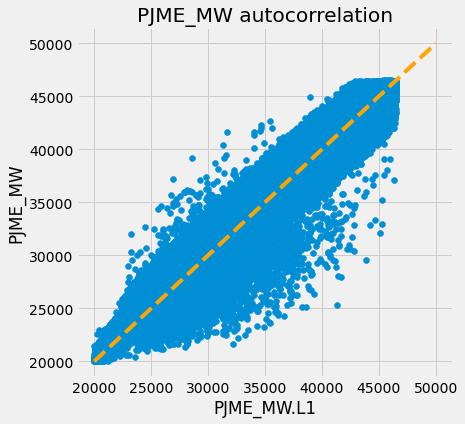

In [18]:
fig, ax = plt.subplots(figsize=(6, 6))
ax.scatter(x=features_and_target['PJME_MW.L1'], y=features_and_target['PJME_MW'])
ax.plot([20000,50000], [20000,50000], linestyle='--', color='orange')
plt.xlabel('PJME_MW.L1')
plt.ylabel('PJME_MW')
plt.title('PJME_MW autocorrelation');

In [19]:
# Drop rows with missing values
features_and_target_cleaned = features_and_target.dropna()

# Create box plot using Plotly Express
fig = px.box(features_and_target_cleaned,
             x='weekday',
             y='PJME_MW',
             color='season',
             title='Power Use MW by Day of Week',
             labels={'weekday': 'Day of Week', 'PJME_MW': 'Energy (MW)'},
             width=800, height=500)

# Show legend outside the plot
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))

fig.show()

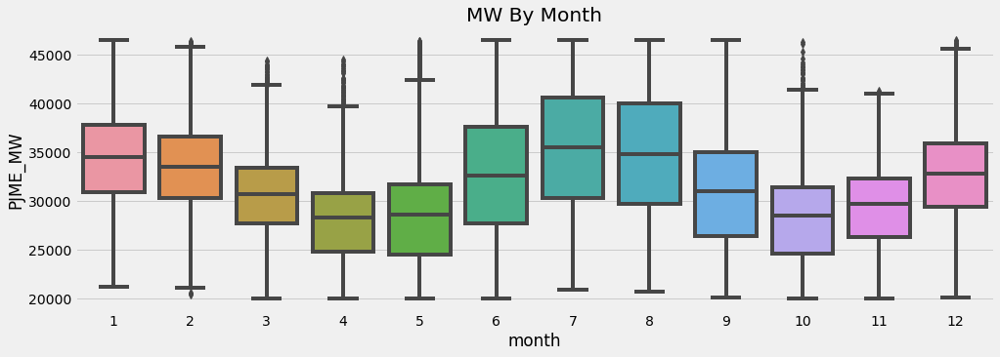

In [20]:
fig, ax = plt.subplots(figsize=(15, 5))
sns.boxplot(data=features_and_target, x='month', y='PJME_MW', ax=ax)
ax.set_title('MW By Month')
plt.show()

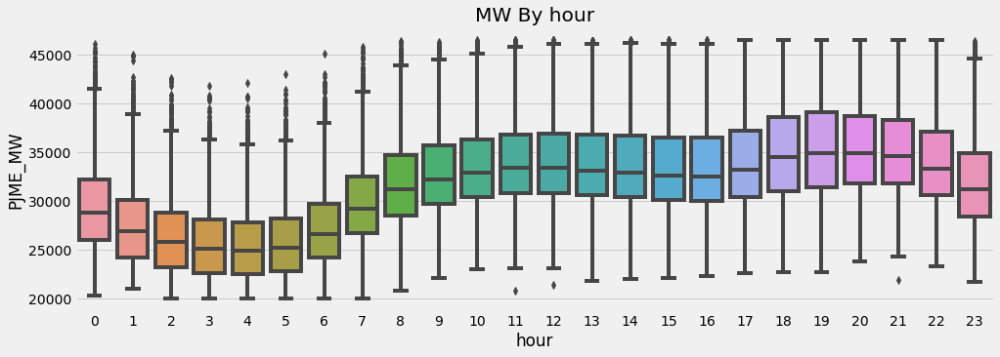

In [21]:
fig, ax = plt.subplots(figsize=(15, 5))
sns.boxplot(data=features_and_target, x='hour', y='PJME_MW', ax=ax)
ax.set_title('MW By hour')
plt.show()

In [22]:
target = 'PJME_MW'
y = features_and_target[target]
X = features_and_target.drop(columns=target)

In [23]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()

In [24]:
X['weekday'] = encoder.fit_transform(X['weekday'])
X['season'] = encoder.fit_transform(X['season'])


In [25]:
cutoff = int(len(X)*0.8)
X_train, y_train = X.iloc[:cutoff], y.iloc[:cutoff]
X_test, y_test = X.iloc[cutoff:], y.iloc[cutoff:]

In [26]:
y_pred_baseline = [y.mean()]*len(y_train)
print(mean_absolute_error(y_train, y_pred_baseline))

4470.751726315829


# Linear Regression

In [27]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()

In [28]:
lr.fit(X_train, y_train)

LinearRegression()

In [29]:
mean_absolute_error(y_train, lr.predict(X_train))

1142.4203194882457

In [30]:
mean_absolute_error(y_test, lr.predict(X_test))

1119.6055765769652

In [31]:
def rmse(y_true, y_pred):
    return np.sqrt(np.mean((y_true - y_pred) ** 2))

In [32]:
rmse(y_test, lr.predict(X_test))

1517.1661289930075

In [33]:
lr.predict(X_test)[:10]

array([29468.32179714, 30058.2841513 , 30631.50276336, 31037.28395441,
       31363.99747443, 31795.82448653, 31887.19540924, 31930.19552143,
       32009.47374151, 32085.03113002])

In [34]:
intercept = round(lr.intercept_,2)
coefficient = np.round(lr.coef_,2)

In [35]:
print(f"PJME_MW = {intercept} + {coefficient}*PJME_MW.L1")

PJME_MW = 10671.4 + [  30.91  -42.83   26.64 -419.94   -4.29   13.8   -13.94    2.69    1.34
  141.4     0.93]*PJME_MW.L1


In [36]:
df_pred_test = pd.DataFrame({
    "y_test": y_test,
    'y_pred': lr.predict(X_test)
})
df_pred_test.tail()

,y_test,y_pred
Datetime,,
2018-01-01 20:00:00,44284.0,43923.919441
2018-01-01 21:00:00,43751.0,43899.944585
2018-01-01 22:00:00,42402.0,43435.051186
2018-01-01 23:00:00,40164.0,42211.108146
2018-01-02 00:00:00,38608.0,39380.826900


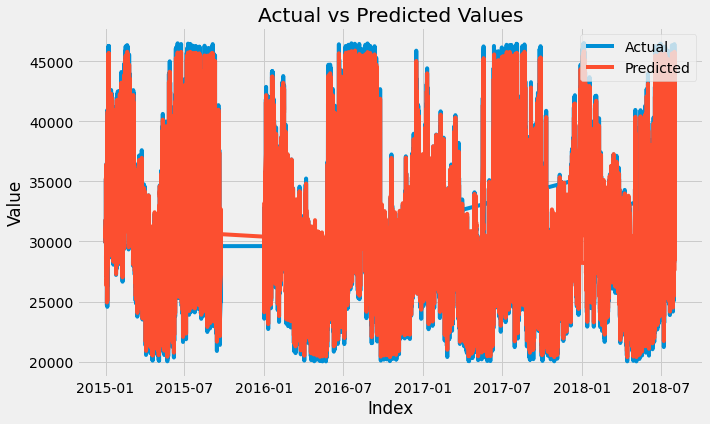

In [37]:
plt.figure(figsize=(10, 6))
plt.plot(df_pred_test['y_test'], label='Actual')
plt.plot(df_pred_test['y_pred'], label='Predicted')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Actual vs Predicted Values')
plt.legend()
plt.show()

# XGB Regression

In [38]:
reg = xgb.XGBRegressor(n_estimators = 1000,early_stopping_rounds=50,learning_rate = 0.01)
reg.fit(X_train,y_train,eval_set=[(X_train,y_train),(X_test,y_test)])

[0]	validation_0-rmse:31777.15541	validation_1-rmse:31338.15303
[1]	validation_0-rmse:31459.95119	validation_1-rmse:31025.04852
[2]	validation_0-rmse:31145.91949	validation_1-rmse:30714.98015
[3]	validation_0-rmse:30835.03486	validation_1-rmse:30408.12257
[4]	validation_0-rmse:30527.25706	validation_1-rmse:30104.29360
[5]	validation_0-rmse:30222.55962	validation_1-rmse:29803.49378
[6]	validation_0-rmse:29920.90894	validation_1-rmse:29505.59122
[7]	validation_0-rmse:29622.28281	validation_1-rmse:29210.77579
[8]	validation_0-rmse:29326.64496	validation_1-rmse:28918.68513
[9]	validation_0-rmse:29033.95803	validation_1-rmse:28629.84452
[10]	validation_0-rmse:28744.20421	validation_1-rmse:28343.71063
[11]	validation_0-rmse:28457.35810	validation_1-rmse:28060.26832
[12]	validation_0-rmse:28173.37434	validation_1-rmse:27779.86160
[13]	validation_0-rmse:27892.23047	validation_1-rmse:27502.32014
[14]	validation_0-rmse:27613.90068	validation_1-rmse:27227.59141
[15]	validation_0-rmse:27338.35815	

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

Text(0.5, 1.0, 'Features Importances')

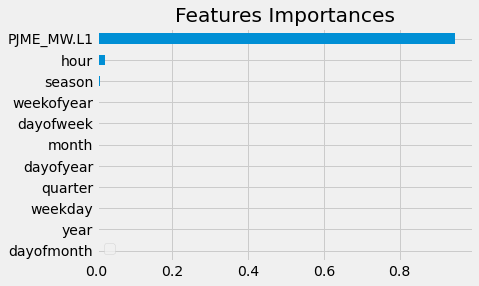

In [40]:
feature_importances  = pd.DataFrame(data=reg.feature_importances_,index = reg.feature_names_in_,columns=['importances'])
feature_importances = feature_importances.sort_values(by = 'importances',ascending=1)
feature_importances.plot(kind='barh')
plt.legend('')
plt.title('Features Importances')

In [41]:
mean_absolute_error(y_test, reg.predict(X_test))

405.691407573633

In [42]:
df_pred_test1 = pd.DataFrame({
    "y_test": y_test,
    'y_pred': reg.predict(X_test)
})
df_pred_test1.tail()

,y_test,y_pred
Datetime,,
2018-01-01 20:00:00,44284.0,43889.781250
2018-01-01 21:00:00,43751.0,43543.035156
2018-01-01 22:00:00,42402.0,42434.710938
2018-01-01 23:00:00,40164.0,39705.375000
2018-01-02 00:00:00,38608.0,37141.738281


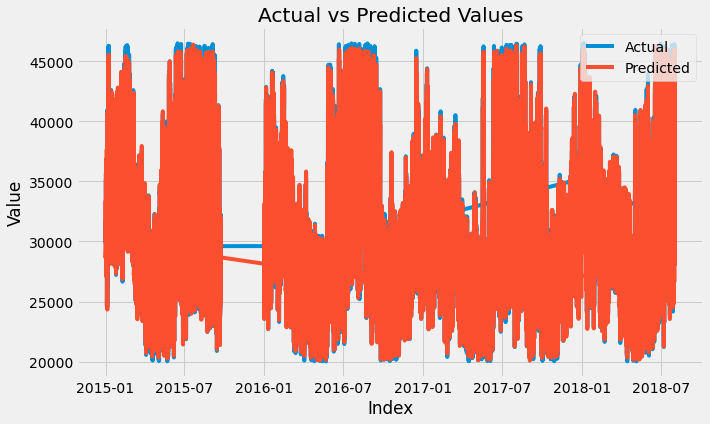

In [43]:
plt.figure(figsize=(10, 6))
plt.plot(df_pred_test1['y_test'], label='Actual')
plt.plot(df_pred_test1['y_pred'], label='Predicted')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Actual vs Predicted Values')
plt.legend()
plt.show()

In [44]:
reg1 = xgb.XGBRegressor(n_estimators = 500, max_depth=5,early_stopping_rounds=50,learning_rate = 0.01)

In [45]:
reg1.fit(X_train,y_train,eval_set=[(X_train,y_train),(X_test,y_test)])

[0]	validation_0-rmse:31777.22610	validation_1-rmse:31338.21688
[1]	validation_0-rmse:31460.09352	validation_1-rmse:31025.10717
[2]	validation_0-rmse:31146.13668	validation_1-rmse:30715.12076
[3]	validation_0-rmse:30835.32204	validation_1-rmse:30408.26571
[4]	validation_0-rmse:30527.61976	validation_1-rmse:30104.44358
[5]	validation_0-rmse:30222.99606	validation_1-rmse:29803.80034
[6]	validation_0-rmse:29921.41553	validation_1-rmse:29506.16081
[7]	validation_0-rmse:29622.85566	validation_1-rmse:29211.30177
[8]	validation_0-rmse:29327.28731	validation_1-rmse:28919.58251
[9]	validation_0-rmse:29034.67139	validation_1-rmse:28630.68175
[10]	validation_0-rmse:28744.99366	validation_1-rmse:28344.49704
[11]	validation_0-rmse:28458.20097	validation_1-rmse:28061.34728
[12]	validation_0-rmse:28174.29331	validation_1-rmse:27780.83321
[13]	validation_0-rmse:27893.21438	validation_1-rmse:27503.40295
[14]	validation_0-rmse:27614.96128	validation_1-rmse:27228.72198
[15]	validation_0-rmse:27339.48380	

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=50,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=5, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=500, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

Text(0.5, 1.0, 'Features Importances')

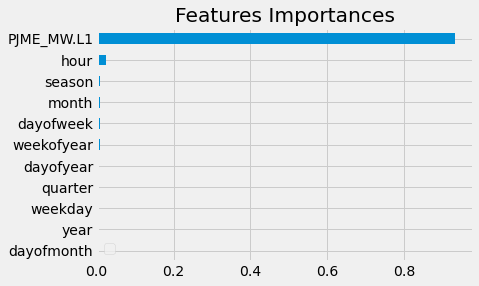

In [46]:
feature_importances1  = pd.DataFrame(data=reg1.feature_importances_,index = reg1.feature_names_in_,columns=['importances'])
feature_importances1 = feature_importances1.sort_values(by = 'importances',ascending=1)
feature_importances1.plot(kind='barh')
plt.legend('')
plt.title('Features Importances')

In [47]:
mean_absolute_error(y_test, reg1.predict(X_test))

543.7264272107736

In [48]:
df_pred_test2 = pd.DataFrame({
    "y_test": y_test,
    'y_pred': reg1.predict(X_test)
})
df_pred_test2.tail()

,y_test,y_pred
Datetime,,
2018-01-01 20:00:00,44284.0,43342.121094
2018-01-01 21:00:00,43751.0,43336.914062
2018-01-01 22:00:00,42402.0,42276.585938
2018-01-01 23:00:00,40164.0,39639.484375
2018-01-02 00:00:00,38608.0,36441.132812


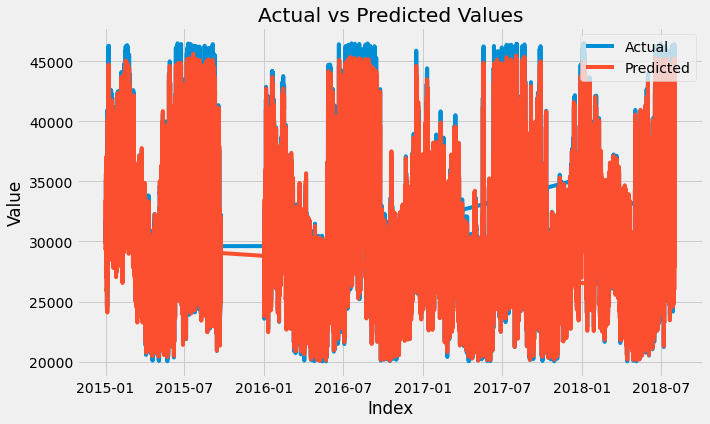

In [49]:
plt.figure(figsize=(10, 6))
plt.plot(df_pred_test2['y_test'], label='Actual')
plt.plot(df_pred_test2['y_pred'], label='Predicted')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Actual vs Predicted Values')
plt.legend()
plt.show()

In [51]:
features_and_target.loc[features_and_target.index[-2], 'PJME_MW']

31154.0

# Forecasting for a never seen date

In [70]:
# Create a DatetimeIndex for the specified date range in one-hour intervals
date_range = pd.date_range(start='2018-01-02 00:00:00', end='2018-02-02 00:00:00', freq='1H')

date_range = pd.to_datetime(date_range)

# Create a DataFrame with the DatetimeIndex as the index
forecasting = pd.DataFrame(index=date_range)

# Extract datetime features for the specified date range
forecasting['hour'] = forecasting.index.hour
forecasting['dayofweek'] = forecasting.index.dayofweek
forecasting['quarter'] = forecasting.index.quarter
forecasting['month'] = forecasting.index.month
forecasting['year'] = forecasting.index.year
forecasting['dayofyear'] = forecasting.index.dayofyear
forecasting['dayofmonth'] = forecasting.index.day
forecasting['weekofyear'] = forecasting.index.weekofyear
forecasting['weekday'] = forecasting.index.weekday
forecasting['season'] = forecasting['month'].apply(lambda x: 
    3 if x in [12, 1, 2] else  # Winter
    1 if x in [3, 4, 5] else   # Spring
    2 if x in [6, 7, 8] else   # Summer
    4  # Fall (September, October, November)
)

forecasting.loc[forecasting.index[0], 'PJME_MW.L1'] = features_and_target.loc[features_and_target.index[-2], 'PJME_MW']


C:\Users\user\AppData\Local\Temp\ipykernel_8516\3922963312.py:17: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)



In [73]:
forecasting

,hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,weekday,season,PJME_MW.L1
2018-01-02 00:00:00,0,1,1,1,2018,2,2,1,1,3,40164.0
2018-01-02 01:00:00,1,1,1,1,2018,2,2,1,1,3,NaN
2018-01-02 02:00:00,2,1,1,1,2018,2,2,1,1,3,NaN
2018-01-02 03:00:00,3,1,1,1,2018,2,2,1,1,3,NaN
2018-01-02 04:00:00,4,1,1,1,2018,2,2,1,1,3,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2018-02-01 20:00:00,20,3,1,2,2018,32,1,5,3,3,NaN
2018-02-01 21:00:00,21,3,1,2,2018,32,1,5,3,3,NaN
2018-02-01 22:00:00,22,3,1,2,2018,32,1,5,3,3,NaN
2018-02-01 23:00:00,23,3,1,2,2018,32,1,5,3,3,NaN


In [74]:
forecasting.index = pd.to_datetime(forecasting.index)

In [79]:
predicted_PJME_MW = []

# Initialize the lagged value for the first row
lagged_value = features_and_target.loc[features_and_target.index[-2], 'PJME_MW']

for index, row in forecasting.iterrows():
    # Use the trained XGBoost model to predict PJME_MW for the current row
    prediction_input = row.to_frame().T
    prediction_input['PJME_MW.L1'] = lagged_value  
    predicted_value = reg.predict(prediction_input)
    predicted_PJME_MW.append(predicted_value[0])
    # Update lagged value for the next row
    lagged_value = predicted_value[0]


forecasting['PJME_MW.L1'] = predicted_PJME_MW

In [80]:
forecasting.head(15)

,hour,dayofweek,quarter,month,year,dayofyear,dayofmonth,weekofyear,weekday,season,PJME_MW.L1
2018-01-02 00:00:00,0,1,1,1,2018,2,2,1,1,3,37174.976562
2018-01-02 01:00:00,1,1,1,1,2018,2,2,1,1,3,30020.677734
2018-01-02 02:00:00,2,1,1,1,2018,2,2,1,1,3,29071.306641
2018-01-02 03:00:00,3,1,1,1,2018,2,2,1,1,3,28828.859375
2018-01-02 04:00:00,4,1,1,1,2018,2,2,1,1,3,28986.914062
2018-01-02 05:00:00,5,1,1,1,2018,2,2,1,1,3,29687.457031
2018-01-02 06:00:00,6,1,1,1,2018,2,2,1,1,3,31474.982422
2018-01-02 07:00:00,7,1,1,1,2018,2,2,1,1,3,34927.316406
2018-01-02 08:00:00,8,1,1,1,2018,2,2,1,1,3,36576.898438
2018-01-02 09:00:00,9,1,1,1,2018,2,2,1,1,3,36247.125000


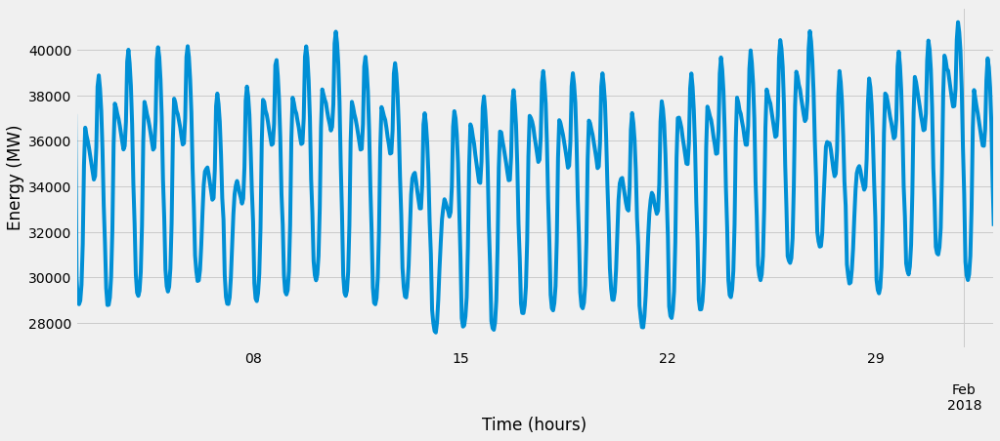

In [82]:
fig, ax = plt.subplots(figsize=(15, 6))
forecasting['PJME_MW.L1'].plot(ax=ax)
ax.set_ylabel('Energy (MW)')
ax.set_xlabel('Time (hours)')

plt.show()